# Import libraries

In [38]:
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
import seaborn as sns

from tqdm import tqdm
from PIL import Image

import torch
import torch.nn as nn
import torch.optim as optim

from torch.utils.data import DataLoader, Dataset
from torchvision import datasets, transforms, models
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import precision_score, recall_score, f1_score, confusion_matrix, classification_report

# Load all images into DataFrame

In [39]:
IMAGE_EXTS = (".jpg", ".jpeg", ".png", ".bmp")

def build_image_df(root_dir):
    rows = []
    for label in os.listdir(root_dir):
        class_dir = os.path.join(root_dir, label)
        if not os.path.isdir(class_dir):
            continue

        for fname in os.listdir(class_dir):
            if fname.lower().endswith(IMAGE_EXTS):
                rows.append({
                    "filepath": os.path.join(class_dir, fname),
                    "label": label,
                    "filename": fname
                })
    return pd.DataFrame(rows)

df = build_image_df("/kaggle/input/animal-image-dataset-90-different-animals/animals/animals")
df["label"].value_counts()

label
beetle      60
parrot      60
fox         60
wolf        60
hedgehog    60
            ..
hyena       60
cat         60
deer        60
turkey      60
boar        60
Name: count, Length: 90, dtype: int64

# Distribution of classes

<Axes: title={'center': 'Top 10 classes by image count'}, xlabel='label'>

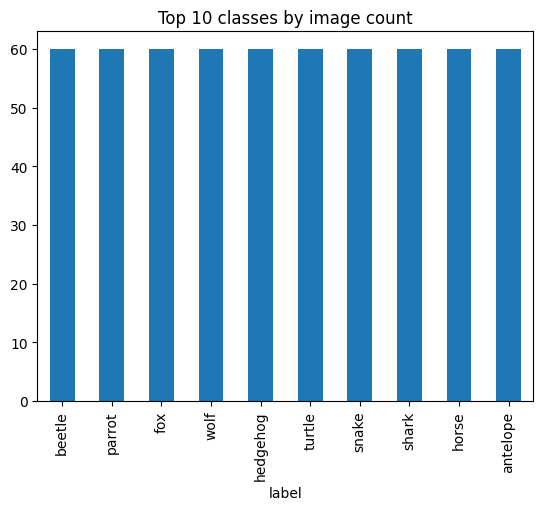

In [22]:
N = 10
(
    df["label"]
    .value_counts()
    .head(N)
    .plot(kind="bar", title=f"Top {N} classes by image count")
)

# Show 10 picture of 10 random classes

/tmp/ipykernel_55/3676855422.py:13: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(1, random_state=seed))


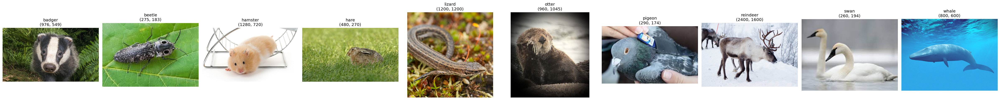

In [23]:
def show_random_classes(df, n_classes=10, seed=42):
    np.random.seed(seed)

    classes = np.random.choice(
        df["label"].unique(),
        size=min(n_classes, df["label"].nunique()),
        replace=False
    )

    df_sample = (
        df[df["label"].isin(classes)]
        .groupby("label", group_keys=False)
        .apply(lambda x: x.sample(1, random_state=seed))
        .reset_index(drop=True)
    )

    n = len(df_sample)

    fig, axes = plt.subplots(
        1, n,
        figsize=(4*n, 4),
        dpi=120
    )

    if n == 1:
        axes = [axes]

    for ax, (_, row) in zip(axes, df_sample.iterrows()):
        img = Image.open(row["filepath"])
        ax.imshow(img)
        ax.set_title(f"{row['label']}\n{img.size}")
        ax.axis("off")

    plt.tight_layout()
    plt.show()

show_random_classes(df, n_classes=10)

# Validate error images

In [24]:
def validate_image(path):
    try:
        with Image.open(path) as img:
            img.verify()
        return True
    except:
        return False

tqdm.pandas()
df["is_valid"] = df["filepath"].progress_apply(validate_image)

invalid_df = df[~df["is_valid"]]
print("Invalid images:", len(invalid_df))

100%|██████████| 5400/5400 [00:04<00:00, 1105.88it/s]

Invalid images: 0


# Read shape, mode of images

In [25]:
def extract_image_meta(path):
    with Image.open(path) as img:
        return pd.Series({
            "width": img.width,
            "height": img.height,
            "mode": img.mode
        })

df[["width", "height", "mode"]] = df["filepath"].progress_apply(extract_image_meta)
df["aspect_ratio"] = df["width"] / df["height"]

100%|██████████| 5400/5400 [00:05<00:00, 1006.08it/s]


# Distribution of width and height

array([[<Axes: title={'center': 'width'}>,
        <Axes: title={'center': 'height'}>]], dtype=object)

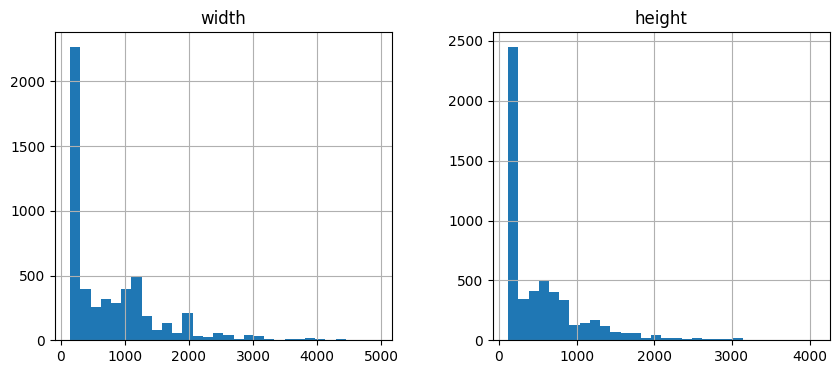

In [26]:
df[["width", "height"]].hist(bins=30, figsize=(10,4))

# Filter “abnormal” images

In [27]:
suspect_size_df = df[
    (df["width"] < 64) |
    (df["height"] < 64) |
    (df["aspect_ratio"] > 3) |
    (df["aspect_ratio"] < 0.33)
]

[355] label=turtle, size=(400, 126)


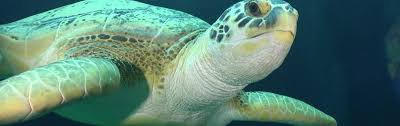

[526] label=horse, size=(392, 128)


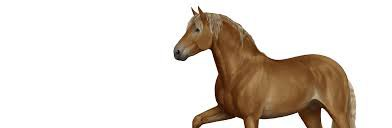

[1188] label=lion, size=(411, 122)


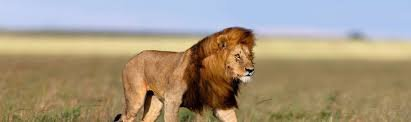

[1358] label=otter, size=(1440, 454)


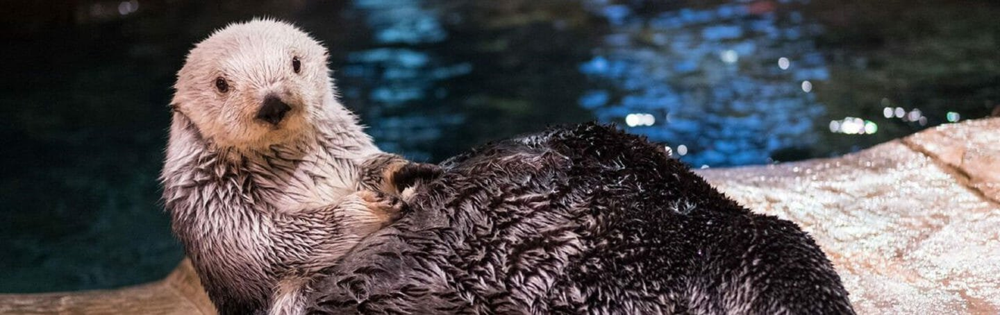

[1806] label=bear, size=(389, 129)


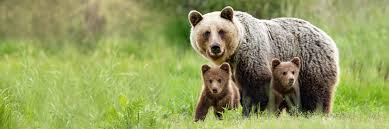

[1822] label=bear, size=(2560, 853)


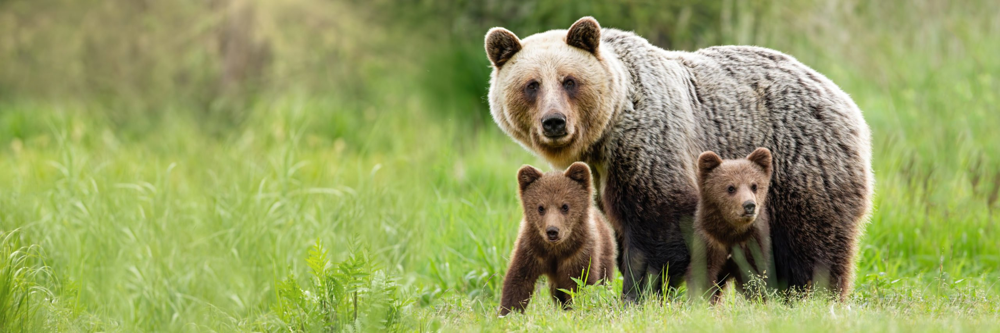

[2179] label=caterpillar, size=(389, 129)


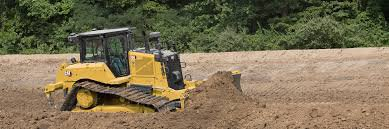

[2564] label=tiger, size=(1120, 350)


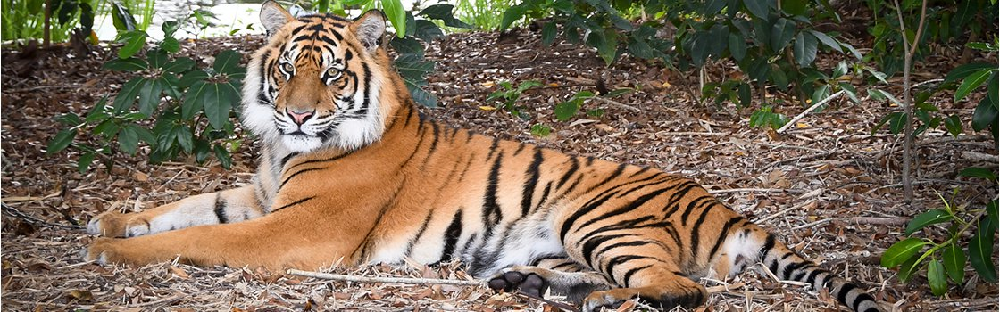

[2578] label=tiger, size=(402, 125)


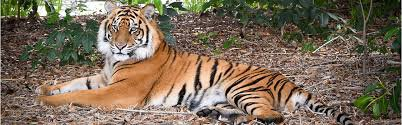

[2926] label=kangaroo, size=(402, 125)


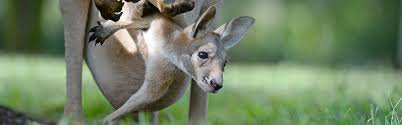

[3223] label=possum, size=(389, 129)


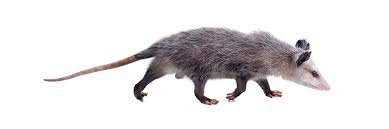

[3597] label=zebra, size=(402, 125)


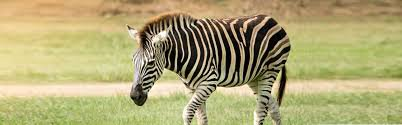

[3644] label=seal, size=(389, 129)


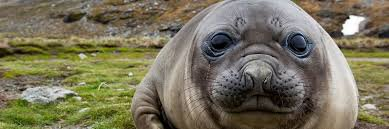

[3669] label=octopus, size=(1440, 454)


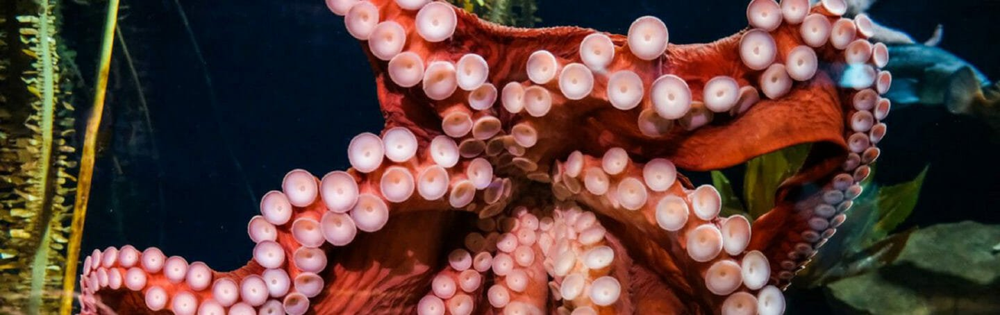

[3899] label=wombat, size=(1120, 350)


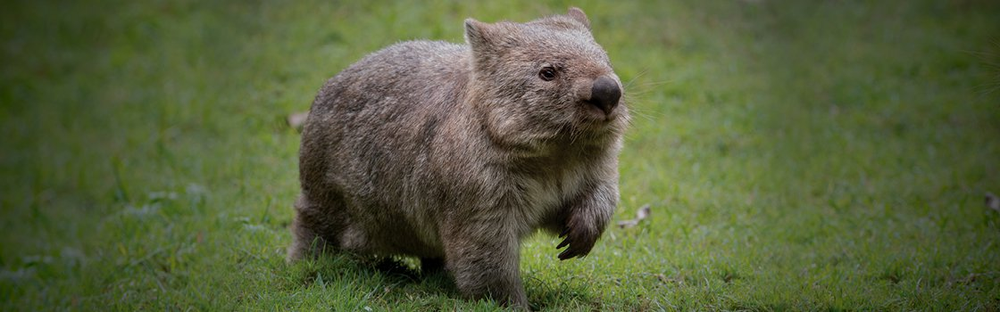

[4050] label=duck, size=(420, 120)


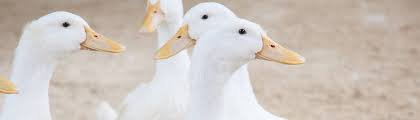

[4051] label=duck, size=(1400, 400)


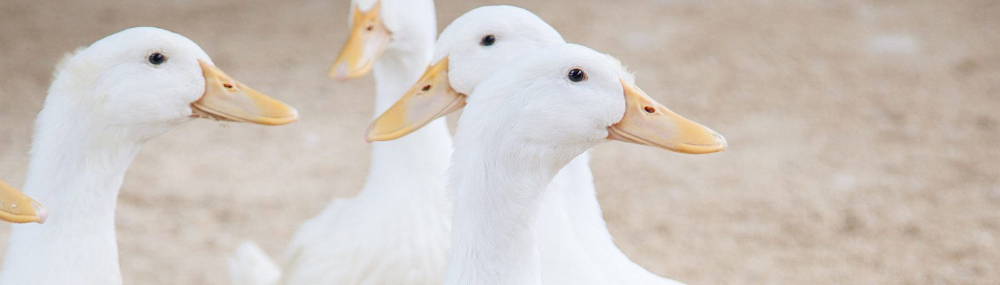

In [28]:
def show_all_images_original(df):
    for i, row in df.iterrows():
        img = Image.open(row["filepath"])
        print(f'[{i}] label={row["label"]}, size={img.size}')
        display(img)

show_all_images_original(suspect_size_df)

# Train the model

In [40]:
le = LabelEncoder()
df["label_idx"] = le.fit_transform(df["label"])

num_classes = df["label_idx"].nunique()

# Split dataset into train, val, test dataset
df_full_train, df_test = train_test_split(df, test_size=0.2, random_state=42)
df_train, df_val = train_test_split(df_full_train, test_size=0.25, random_state=42)

df_full_train = df_full_train.reset_index(drop=True)
df_train = df_train.reset_index(drop=True)
df_val = df_val.reset_index(drop=True)
df_test = df_test.reset_index(drop=True)

In [41]:
# set up for using gpu to training
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cuda')

In [42]:
class ImageDFDataset(Dataset):
    def __init__(self, df, transform=None):
        self.df = df.reset_index(drop=True)
        self.transform = transform

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        img = Image.open(row["filepath"]).convert("RGB")

        if self.transform:
            img = self.transform(img)

        label = row["label_idx"]
        return img, label

In [32]:
# Pre-processing images input
IMG_SIZE = 224
BATCH_SIZE = 20

train_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(20),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std =[0.229, 0.224, 0.225]
    )
])

val_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std =[0.229, 0.224, 0.225]
    )
])

In [33]:
# Create DataLoader
train_ds = ImageDFDataset(df_train, transform=train_transform)
val_ds   = ImageDFDataset(df_val, transform=val_transform)

train_loader = DataLoader(
    train_ds,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=2,
    pin_memory=True
)

val_loader = DataLoader(
    val_ds,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=2,
    pin_memory=True
)

In [34]:
# First try with resnet18 pretrained model
model = models.resnet18(weights="IMAGENET1K_V1")
model.fc = nn.Linear(model.fc.in_features, 90)
model = model.to(device)

# Here we have 90 classes so I use CrossEntropyLoss
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=1e-4)

In [11]:
# Create train function
def train_one_epoch(model, loader):
    model.train()
    running_loss, correct, total = 0, 0, 0

    for images, labels in tqdm(loader):
        images, labels = images.to(device), labels.to(device)

        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)

        loss.backward()
        optimizer.step()

        running_loss += loss.item()
        correct += (outputs.argmax(1) == labels).sum().item()
        total += labels.size(0)

    return running_loss / len(loader), correct / total

In [12]:
# Create validate function
def validate(model, loader):
    model.eval()
    total_loss, correct, total = 0, 0, 0

    with torch.no_grad():
        for imgs, labels in loader:
            imgs, labels = imgs.to(device), labels.to(device)

            outputs = model(imgs)
            loss = criterion(outputs, labels)

            total_loss += loss.item()
            correct += (outputs.argmax(1) == labels).sum().item()
            total += labels.size(0)

    return total_loss / len(loader), correct / total


In [37]:
x, y = train_ds[0]

print(type(x), x.shape)
print(type(y), y)

<class 'torch.Tensor'> torch.Size([3, 224, 224])
<class 'numpy.int64'> 75


In [38]:
# Train model

EPOCHS = 20

for epoch in range(EPOCHS):
    train_loss, train_acc = train_one_epoch(model, train_loader)
    val_loss, val_acc = validate(model, val_loader)

    print(
        f"Epoch {epoch+1}/{EPOCHS} | "
        f"Train Acc: {train_acc:.4f} | "
        f"Val Acc: {val_acc:.4f}"
    )

100%|██████████| 162/162 [00:24<00:00,  6.52it/s]


Epoch 1/20 | Train Acc: 0.3901 | Val Acc: 0.6657


100%|██████████| 162/162 [00:24<00:00,  6.63it/s]


Epoch 2/20 | Train Acc: 0.7917 | Val Acc: 0.7917


100%|██████████| 162/162 [00:24<00:00,  6.69it/s]


Epoch 3/20 | Train Acc: 0.8920 | Val Acc: 0.8259


100%|██████████| 162/162 [00:24<00:00,  6.65it/s]


Epoch 4/20 | Train Acc: 0.9478 | Val Acc: 0.8528


100%|██████████| 162/162 [00:24<00:00,  6.59it/s]


Epoch 5/20 | Train Acc: 0.9802 | Val Acc: 0.8463


100%|██████████| 162/162 [00:25<00:00,  6.45it/s]


Epoch 6/20 | Train Acc: 0.9870 | Val Acc: 0.8583


100%|██████████| 162/162 [00:24<00:00,  6.71it/s]


Epoch 7/20 | Train Acc: 0.9944 | Val Acc: 0.8574


100%|██████████| 162/162 [00:24<00:00,  6.61it/s]


Epoch 8/20 | Train Acc: 0.9948 | Val Acc: 0.8630


100%|██████████| 162/162 [00:24<00:00,  6.65it/s]


Epoch 9/20 | Train Acc: 0.9969 | Val Acc: 0.8685


100%|██████████| 162/162 [00:24<00:00,  6.70it/s]


Epoch 10/20 | Train Acc: 0.9988 | Val Acc: 0.8694


100%|██████████| 162/162 [00:24<00:00,  6.56it/s]


Epoch 11/20 | Train Acc: 0.9988 | Val Acc: 0.8676


100%|██████████| 162/162 [00:25<00:00,  6.44it/s]


Epoch 12/20 | Train Acc: 0.9994 | Val Acc: 0.8676


100%|██████████| 162/162 [00:24<00:00,  6.66it/s]


Epoch 13/20 | Train Acc: 1.0000 | Val Acc: 0.8639


100%|██████████| 162/162 [00:24<00:00,  6.63it/s]


Epoch 14/20 | Train Acc: 0.9978 | Val Acc: 0.8509


100%|██████████| 162/162 [00:24<00:00,  6.69it/s]


Epoch 15/20 | Train Acc: 0.9966 | Val Acc: 0.8574


100%|██████████| 162/162 [00:24<00:00,  6.57it/s]


Epoch 16/20 | Train Acc: 0.9975 | Val Acc: 0.8537


100%|██████████| 162/162 [00:24<00:00,  6.65it/s]


Epoch 17/20 | Train Acc: 0.9972 | Val Acc: 0.8630


100%|██████████| 162/162 [00:24<00:00,  6.74it/s]


Epoch 18/20 | Train Acc: 0.9988 | Val Acc: 0.8685


100%|██████████| 162/162 [00:24<00:00,  6.50it/s]


Epoch 19/20 | Train Acc: 0.9966 | Val Acc: 0.8444


100%|██████████| 162/162 [00:24<00:00,  6.72it/s]


Epoch 20/20 | Train Acc: 0.9963 | Val Acc: 0.8509


# Transfer learning

In [14]:
# Rebuild model with backbone resnet18
class AnimalClassification(nn.Module):
    def __init__(self, size_inner=256, droprate=0.2, num_classes=90):
        super(AnimalClassification, self).__init__()

        # Load pretrained ResNet18
        self.base_model = models.resnet18(weights="IMAGENET1K_V1")

        # Freeze backbone
        for param in self.base_model.parameters():
            param.requires_grad = False

        # Remove original FC layer
        in_features = self.base_model.fc.in_features
        self.base_model.fc = nn.Identity()

        # Custom head
        self.inner = nn.Linear(in_features, size_inner)
        self.relu = nn.ReLU()
        self.dropout = nn.Dropout(droprate)
        self.output_layer = nn.Linear(size_inner, num_classes)

    def forward(self, x):
        x = self.base_model(x)          # (B, 512)
        x = self.inner(x)
        x = self.relu(x)
        x = self.dropout(x)
        x = self.output_layer(x)
        return x

In [15]:
# Create make model function, later use to tune params
def make_model(learning_rate=0.0001, size_inner=256, droprate=0.3):
    model = AnimalClassification(
        size_inner=size_inner,
        droprate=droprate,
        num_classes=90
    ).to(device)
    
    optimizer = torch.optim.Adam(
        filter(lambda p: p.requires_grad, model.parameters()),
        lr=learning_rate
    )
    return model, optimizer

In [41]:
EPOCHS = 30
model, optimizer = make_model(learning_rate=0.0001, size_inner=256, droprate=0.3)

for epoch in range(EPOCHS):
    train_loss, train_acc = train_one_epoch(model, train_loader)
    val_loss, val_acc = validate(model, val_loader)

    print(
        f"Epoch {epoch+1}/{EPOCHS} | "
        f"Train Acc: {train_acc:.4f} | "
        f"Val Acc: {val_acc:.4f}"
    )

100%|██████████| 162/162 [00:22<00:00,  7.06it/s]


Epoch 1/30 | Train Acc: 0.0410 | Val Acc: 0.1315


100%|██████████| 162/162 [00:23<00:00,  6.92it/s]


Epoch 2/30 | Train Acc: 0.1812 | Val Acc: 0.3611


100%|██████████| 162/162 [00:22<00:00,  7.21it/s]


Epoch 3/30 | Train Acc: 0.3127 | Val Acc: 0.5250


100%|██████████| 162/162 [00:23<00:00,  6.95it/s]


Epoch 4/30 | Train Acc: 0.4278 | Val Acc: 0.6000


100%|██████████| 162/162 [00:23<00:00,  6.93it/s]


Epoch 5/30 | Train Acc: 0.4929 | Val Acc: 0.6463


100%|██████████| 162/162 [00:22<00:00,  7.14it/s]


Epoch 6/30 | Train Acc: 0.5565 | Val Acc: 0.6824


100%|██████████| 162/162 [00:23<00:00,  7.04it/s]


Epoch 7/30 | Train Acc: 0.5923 | Val Acc: 0.7074


100%|██████████| 162/162 [00:23<00:00,  6.85it/s]


Epoch 8/30 | Train Acc: 0.6090 | Val Acc: 0.7324


100%|██████████| 162/162 [00:22<00:00,  7.19it/s]


Epoch 9/30 | Train Acc: 0.6420 | Val Acc: 0.7574


100%|██████████| 162/162 [00:23<00:00,  7.03it/s]


Epoch 10/30 | Train Acc: 0.6512 | Val Acc: 0.7315


100%|██████████| 162/162 [00:23<00:00,  7.02it/s]


Epoch 11/30 | Train Acc: 0.6707 | Val Acc: 0.7630


100%|██████████| 162/162 [00:23<00:00,  6.96it/s]


Epoch 12/30 | Train Acc: 0.6769 | Val Acc: 0.7565


100%|██████████| 162/162 [00:22<00:00,  7.07it/s]


Epoch 13/30 | Train Acc: 0.7071 | Val Acc: 0.7685


100%|██████████| 162/162 [00:22<00:00,  7.14it/s]


Epoch 14/30 | Train Acc: 0.7133 | Val Acc: 0.7667


100%|██████████| 162/162 [00:22<00:00,  7.19it/s]


Epoch 15/30 | Train Acc: 0.7296 | Val Acc: 0.7731


100%|██████████| 162/162 [00:22<00:00,  7.14it/s]


Epoch 16/30 | Train Acc: 0.7401 | Val Acc: 0.7843


100%|██████████| 162/162 [00:22<00:00,  7.29it/s]


Epoch 17/30 | Train Acc: 0.7426 | Val Acc: 0.7907


100%|██████████| 162/162 [00:23<00:00,  6.83it/s]


Epoch 18/30 | Train Acc: 0.7642 | Val Acc: 0.7704


100%|██████████| 162/162 [00:23<00:00,  6.93it/s]


Epoch 19/30 | Train Acc: 0.7577 | Val Acc: 0.7926


100%|██████████| 162/162 [00:23<00:00,  6.99it/s]


Epoch 20/30 | Train Acc: 0.7565 | Val Acc: 0.7954


100%|██████████| 162/162 [00:23<00:00,  6.93it/s]


Epoch 21/30 | Train Acc: 0.7673 | Val Acc: 0.8009


100%|██████████| 162/162 [00:24<00:00,  6.65it/s]


Epoch 22/30 | Train Acc: 0.7725 | Val Acc: 0.8056


100%|██████████| 162/162 [00:23<00:00,  6.90it/s]


Epoch 23/30 | Train Acc: 0.7806 | Val Acc: 0.8176


100%|██████████| 162/162 [00:22<00:00,  7.05it/s]


Epoch 24/30 | Train Acc: 0.7867 | Val Acc: 0.8083


100%|██████████| 162/162 [00:23<00:00,  6.98it/s]


Epoch 25/30 | Train Acc: 0.7960 | Val Acc: 0.8102


100%|██████████| 162/162 [00:23<00:00,  6.86it/s]


Epoch 26/30 | Train Acc: 0.7941 | Val Acc: 0.8176


100%|██████████| 162/162 [00:23<00:00,  6.83it/s]


Epoch 27/30 | Train Acc: 0.8096 | Val Acc: 0.8176


100%|██████████| 162/162 [00:22<00:00,  7.19it/s]


Epoch 28/30 | Train Acc: 0.8031 | Val Acc: 0.8231


100%|██████████| 162/162 [00:22<00:00,  7.10it/s]


Epoch 29/30 | Train Acc: 0.8015 | Val Acc: 0.8083


100%|██████████| 162/162 [00:22<00:00,  7.09it/s]


Epoch 30/30 | Train Acc: 0.8040 | Val Acc: 0.8204


# Tuning learning rate

In [42]:
results = {}

learning_rates = [0.0001, 0.0005, 0.001, 0.003]
EPOCHS = 20

for lr in learning_rates:
    print (f"Learning rate = {lr}")
    
    model, optimizer = make_model(learning_rate=lr, size_inner=256, droprate=0.3)

    val_accs = []
    
    for epoch in range(EPOCHS):
        train_loss, train_acc = train_one_epoch(model, train_loader)
        val_loss, val_acc = validate(model, val_loader)
        val_accs.append(val_acc)
    
        print(
            f"Epoch {epoch+1}/{EPOCHS} | "
            f"Train Acc: {train_acc:.4f} | "
            f"Val Acc: {val_acc:.4f}"
        )

    results[lr] = val_accs

Learning rate = 0.0001


100%|██████████| 162/162 [00:21<00:00,  7.48it/s]


Epoch 1/20 | Train Acc: 0.0509 | Val Acc: 0.1602


100%|██████████| 162/162 [00:21<00:00,  7.37it/s]


Epoch 2/20 | Train Acc: 0.1892 | Val Acc: 0.3778


100%|██████████| 162/162 [00:21<00:00,  7.48it/s]


Epoch 3/20 | Train Acc: 0.3185 | Val Acc: 0.5778


100%|██████████| 162/162 [00:21<00:00,  7.39it/s]


Epoch 4/20 | Train Acc: 0.4123 | Val Acc: 0.6102


100%|██████████| 162/162 [00:22<00:00,  7.28it/s]


Epoch 5/20 | Train Acc: 0.5028 | Val Acc: 0.6556


100%|██████████| 162/162 [00:23<00:00,  6.96it/s]


Epoch 6/20 | Train Acc: 0.5358 | Val Acc: 0.6944


100%|██████████| 162/162 [00:22<00:00,  7.30it/s]


Epoch 7/20 | Train Acc: 0.5698 | Val Acc: 0.7102


100%|██████████| 162/162 [00:22<00:00,  7.14it/s]


Epoch 8/20 | Train Acc: 0.6188 | Val Acc: 0.7398


100%|██████████| 162/162 [00:22<00:00,  7.20it/s]


Epoch 9/20 | Train Acc: 0.6241 | Val Acc: 0.7481


100%|██████████| 162/162 [00:23<00:00,  6.96it/s]


Epoch 10/20 | Train Acc: 0.6463 | Val Acc: 0.7528


100%|██████████| 162/162 [00:22<00:00,  7.09it/s]


Epoch 11/20 | Train Acc: 0.6735 | Val Acc: 0.7593


100%|██████████| 162/162 [00:22<00:00,  7.16it/s]


Epoch 12/20 | Train Acc: 0.6972 | Val Acc: 0.7630


100%|██████████| 162/162 [00:23<00:00,  7.00it/s]


Epoch 13/20 | Train Acc: 0.7003 | Val Acc: 0.7759


100%|██████████| 162/162 [00:23<00:00,  6.99it/s]


Epoch 14/20 | Train Acc: 0.7049 | Val Acc: 0.7870


100%|██████████| 162/162 [00:22<00:00,  7.33it/s]


Epoch 15/20 | Train Acc: 0.7157 | Val Acc: 0.7944


100%|██████████| 162/162 [00:23<00:00,  6.96it/s]


Epoch 16/20 | Train Acc: 0.7330 | Val Acc: 0.7972


100%|██████████| 162/162 [00:22<00:00,  7.14it/s]


Epoch 17/20 | Train Acc: 0.7503 | Val Acc: 0.7870


100%|██████████| 162/162 [00:22<00:00,  7.13it/s]


Epoch 18/20 | Train Acc: 0.7457 | Val Acc: 0.7898


100%|██████████| 162/162 [00:22<00:00,  7.27it/s]


Epoch 19/20 | Train Acc: 0.7512 | Val Acc: 0.8009


100%|██████████| 162/162 [00:22<00:00,  7.22it/s]


Epoch 20/20 | Train Acc: 0.7586 | Val Acc: 0.8074
Learning rate = 0.0005


100%|██████████| 162/162 [00:21<00:00,  7.36it/s]


Epoch 1/20 | Train Acc: 0.1414 | Val Acc: 0.4796


100%|██████████| 162/162 [00:22<00:00,  7.15it/s]


Epoch 2/20 | Train Acc: 0.4380 | Val Acc: 0.6704


100%|██████████| 162/162 [00:22<00:00,  7.18it/s]


Epoch 3/20 | Train Acc: 0.5821 | Val Acc: 0.7056


100%|██████████| 162/162 [00:22<00:00,  7.20it/s]


Epoch 4/20 | Train Acc: 0.6654 | Val Acc: 0.7565


100%|██████████| 162/162 [00:22<00:00,  7.28it/s]


Epoch 5/20 | Train Acc: 0.6935 | Val Acc: 0.7667


100%|██████████| 162/162 [00:22<00:00,  7.13it/s]


Epoch 6/20 | Train Acc: 0.7207 | Val Acc: 0.7787


100%|██████████| 162/162 [00:22<00:00,  7.29it/s]


Epoch 7/20 | Train Acc: 0.7448 | Val Acc: 0.7778


100%|██████████| 162/162 [00:23<00:00,  6.86it/s]


Epoch 8/20 | Train Acc: 0.7685 | Val Acc: 0.7981


100%|██████████| 162/162 [00:23<00:00,  6.86it/s]


Epoch 9/20 | Train Acc: 0.7744 | Val Acc: 0.7861


100%|██████████| 162/162 [00:22<00:00,  7.27it/s]


Epoch 10/20 | Train Acc: 0.7935 | Val Acc: 0.8093


100%|██████████| 162/162 [00:21<00:00,  7.42it/s]


Epoch 11/20 | Train Acc: 0.8077 | Val Acc: 0.8065


100%|██████████| 162/162 [00:22<00:00,  7.36it/s]


Epoch 12/20 | Train Acc: 0.8093 | Val Acc: 0.7963


100%|██████████| 162/162 [00:22<00:00,  7.10it/s]


Epoch 13/20 | Train Acc: 0.8160 | Val Acc: 0.8167


100%|██████████| 162/162 [00:22<00:00,  7.28it/s]


Epoch 14/20 | Train Acc: 0.8312 | Val Acc: 0.8176


100%|██████████| 162/162 [00:22<00:00,  7.28it/s]


Epoch 15/20 | Train Acc: 0.8373 | Val Acc: 0.8167


100%|██████████| 162/162 [00:22<00:00,  7.16it/s]


Epoch 16/20 | Train Acc: 0.8392 | Val Acc: 0.8241


100%|██████████| 162/162 [00:22<00:00,  7.34it/s]


Epoch 17/20 | Train Acc: 0.8318 | Val Acc: 0.8167


100%|██████████| 162/162 [00:22<00:00,  7.06it/s]


Epoch 18/20 | Train Acc: 0.8392 | Val Acc: 0.8167


100%|██████████| 162/162 [00:21<00:00,  7.40it/s]


Epoch 19/20 | Train Acc: 0.8543 | Val Acc: 0.8269


100%|██████████| 162/162 [00:22<00:00,  7.07it/s]


Epoch 20/20 | Train Acc: 0.8614 | Val Acc: 0.8241
Learning rate = 0.001


100%|██████████| 162/162 [00:22<00:00,  7.35it/s]


Epoch 1/20 | Train Acc: 0.1738 | Val Acc: 0.5407


100%|██████████| 162/162 [00:22<00:00,  7.27it/s]


Epoch 2/20 | Train Acc: 0.4710 | Val Acc: 0.6917


100%|██████████| 162/162 [00:23<00:00,  7.04it/s]


Epoch 3/20 | Train Acc: 0.5969 | Val Acc: 0.7287


100%|██████████| 162/162 [00:22<00:00,  7.35it/s]


Epoch 4/20 | Train Acc: 0.6500 | Val Acc: 0.7648


100%|██████████| 162/162 [00:21<00:00,  7.44it/s]


Epoch 5/20 | Train Acc: 0.6873 | Val Acc: 0.7833


100%|██████████| 162/162 [00:22<00:00,  7.23it/s]


Epoch 6/20 | Train Acc: 0.7213 | Val Acc: 0.7889


100%|██████████| 162/162 [00:22<00:00,  7.07it/s]


Epoch 7/20 | Train Acc: 0.7349 | Val Acc: 0.7796


100%|██████████| 162/162 [00:22<00:00,  7.27it/s]


Epoch 8/20 | Train Acc: 0.7444 | Val Acc: 0.7954


100%|██████████| 162/162 [00:23<00:00,  6.95it/s]


Epoch 9/20 | Train Acc: 0.7645 | Val Acc: 0.8074


100%|██████████| 162/162 [00:23<00:00,  7.00it/s]


Epoch 10/20 | Train Acc: 0.7722 | Val Acc: 0.8037


100%|██████████| 162/162 [00:22<00:00,  7.21it/s]


Epoch 11/20 | Train Acc: 0.7886 | Val Acc: 0.8046


100%|██████████| 162/162 [00:22<00:00,  7.31it/s]


Epoch 12/20 | Train Acc: 0.7963 | Val Acc: 0.7935


100%|██████████| 162/162 [00:22<00:00,  7.21it/s]


Epoch 13/20 | Train Acc: 0.8043 | Val Acc: 0.8194


100%|██████████| 162/162 [00:23<00:00,  7.00it/s]


Epoch 14/20 | Train Acc: 0.8062 | Val Acc: 0.7963


100%|██████████| 162/162 [00:22<00:00,  7.16it/s]


Epoch 15/20 | Train Acc: 0.8056 | Val Acc: 0.8056


100%|██████████| 162/162 [00:21<00:00,  7.37it/s]


Epoch 16/20 | Train Acc: 0.8130 | Val Acc: 0.8139


100%|██████████| 162/162 [00:22<00:00,  7.05it/s]


Epoch 17/20 | Train Acc: 0.8315 | Val Acc: 0.8130


100%|██████████| 162/162 [00:22<00:00,  7.13it/s]


Epoch 18/20 | Train Acc: 0.8358 | Val Acc: 0.8157


100%|██████████| 162/162 [00:23<00:00,  6.98it/s]


Epoch 19/20 | Train Acc: 0.8321 | Val Acc: 0.8130


100%|██████████| 162/162 [00:22<00:00,  7.33it/s]


Epoch 20/20 | Train Acc: 0.8321 | Val Acc: 0.8120
Learning rate = 0.003


100%|██████████| 162/162 [00:22<00:00,  7.32it/s]


Epoch 1/20 | Train Acc: 0.1349 | Val Acc: 0.4713


100%|██████████| 162/162 [00:22<00:00,  7.25it/s]


Epoch 2/20 | Train Acc: 0.3491 | Val Acc: 0.5657


100%|██████████| 162/162 [00:22<00:00,  7.06it/s]


Epoch 3/20 | Train Acc: 0.4219 | Val Acc: 0.5713


100%|██████████| 162/162 [00:22<00:00,  7.08it/s]


Epoch 4/20 | Train Acc: 0.4691 | Val Acc: 0.6352


100%|██████████| 162/162 [00:22<00:00,  7.22it/s]


Epoch 5/20 | Train Acc: 0.5000 | Val Acc: 0.6676


100%|██████████| 162/162 [00:22<00:00,  7.13it/s]


Epoch 6/20 | Train Acc: 0.5133 | Val Acc: 0.7000


100%|██████████| 162/162 [00:22<00:00,  7.13it/s]


Epoch 7/20 | Train Acc: 0.5062 | Val Acc: 0.6907


100%|██████████| 162/162 [00:22<00:00,  7.10it/s]


Epoch 8/20 | Train Acc: 0.5256 | Val Acc: 0.7083


100%|██████████| 162/162 [00:22<00:00,  7.17it/s]


Epoch 9/20 | Train Acc: 0.5392 | Val Acc: 0.7009


100%|██████████| 162/162 [00:22<00:00,  7.06it/s]


Epoch 10/20 | Train Acc: 0.5546 | Val Acc: 0.7093


100%|██████████| 162/162 [00:22<00:00,  7.21it/s]


Epoch 11/20 | Train Acc: 0.5407 | Val Acc: 0.7241


100%|██████████| 162/162 [00:22<00:00,  7.24it/s]


Epoch 12/20 | Train Acc: 0.5617 | Val Acc: 0.7019


100%|██████████| 162/162 [00:22<00:00,  7.07it/s]


Epoch 13/20 | Train Acc: 0.5460 | Val Acc: 0.7204


100%|██████████| 162/162 [00:22<00:00,  7.29it/s]


Epoch 14/20 | Train Acc: 0.5654 | Val Acc: 0.7231


100%|██████████| 162/162 [00:22<00:00,  7.11it/s]


Epoch 15/20 | Train Acc: 0.5836 | Val Acc: 0.7204


100%|██████████| 162/162 [00:21<00:00,  7.39it/s]


Epoch 16/20 | Train Acc: 0.5744 | Val Acc: 0.7167


100%|██████████| 162/162 [00:23<00:00,  7.03it/s]


Epoch 17/20 | Train Acc: 0.5799 | Val Acc: 0.7278


100%|██████████| 162/162 [00:21<00:00,  7.42it/s]


Epoch 18/20 | Train Acc: 0.5954 | Val Acc: 0.7074


100%|██████████| 162/162 [00:21<00:00,  7.52it/s]


Epoch 19/20 | Train Acc: 0.5858 | Val Acc: 0.7361


100%|██████████| 162/162 [00:22<00:00,  7.29it/s]


Epoch 20/20 | Train Acc: 0.5781 | Val Acc: 0.7250


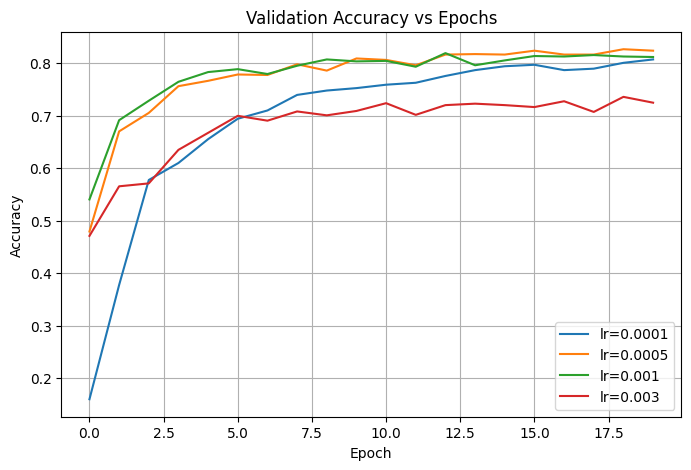

In [43]:
plt.figure(figsize=(8, 5))
for lr, accs in results.items():
    plt.plot(accs, label=f"lr={lr}")

plt.title("Validation Accuracy vs Epochs")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.legend()
plt.grid(True)
plt.show()

# Tuning Drop rate

In [44]:
results = {}

drop_rates = [0.0, 0.2, 0.3, 0.5]
EPOCHS = 15

for dr in drop_rates:
    print (f"Drop rate = {dr}")
    
    model, optimizer = make_model(learning_rate=0.0005, size_inner=256, droprate=dr)

    val_accs = []
    
    for epoch in range(EPOCHS):
        train_loss, train_acc = train_one_epoch(model, train_loader)
        val_loss, val_acc = validate(model, val_loader)
        val_accs.append(val_acc)

        print(
                f"Epoch {epoch+1}/{EPOCHS} | "
                f"Train Acc: {train_acc:.4f} | "
                f"Val Acc: {val_acc:.4f}"
            )

    results[dr] = val_accs

Drop rate = 0.0


100%|██████████| 162/162 [00:22<00:00,  7.33it/s]


Epoch 1/15 | Train Acc: 0.2034 | Val Acc: 0.4648


100%|██████████| 162/162 [00:22<00:00,  7.19it/s]


Epoch 2/15 | Train Acc: 0.5691 | Val Acc: 0.7019


100%|██████████| 162/162 [00:21<00:00,  7.42it/s]


Epoch 3/15 | Train Acc: 0.6997 | Val Acc: 0.7037


100%|██████████| 162/162 [00:21<00:00,  7.46it/s]


Epoch 4/15 | Train Acc: 0.7565 | Val Acc: 0.7509


100%|██████████| 162/162 [00:21<00:00,  7.41it/s]


Epoch 5/15 | Train Acc: 0.7790 | Val Acc: 0.7815


100%|██████████| 162/162 [00:21<00:00,  7.48it/s]


Epoch 6/15 | Train Acc: 0.8151 | Val Acc: 0.8000


100%|██████████| 162/162 [00:22<00:00,  7.29it/s]


Epoch 7/15 | Train Acc: 0.8213 | Val Acc: 0.8019


100%|██████████| 162/162 [00:21<00:00,  7.56it/s]


Epoch 8/15 | Train Acc: 0.8512 | Val Acc: 0.8028


100%|██████████| 162/162 [00:21<00:00,  7.47it/s]


Epoch 9/15 | Train Acc: 0.8627 | Val Acc: 0.8046


100%|██████████| 162/162 [00:21<00:00,  7.54it/s]


Epoch 10/15 | Train Acc: 0.8673 | Val Acc: 0.8037


100%|██████████| 162/162 [00:21<00:00,  7.62it/s]


Epoch 11/15 | Train Acc: 0.8738 | Val Acc: 0.8194


100%|██████████| 162/162 [00:22<00:00,  7.36it/s]


Epoch 12/15 | Train Acc: 0.8855 | Val Acc: 0.8139


100%|██████████| 162/162 [00:21<00:00,  7.50it/s]


Epoch 13/15 | Train Acc: 0.8858 | Val Acc: 0.8194


100%|██████████| 162/162 [00:21<00:00,  7.48it/s]


Epoch 14/15 | Train Acc: 0.8889 | Val Acc: 0.8287


100%|██████████| 162/162 [00:21<00:00,  7.54it/s]


Epoch 15/15 | Train Acc: 0.8941 | Val Acc: 0.8287
Drop rate = 0.2


100%|██████████| 162/162 [00:22<00:00,  7.32it/s]


Epoch 1/15 | Train Acc: 0.1741 | Val Acc: 0.4880


100%|██████████| 162/162 [00:21<00:00,  7.56it/s]


Epoch 2/15 | Train Acc: 0.5009 | Val Acc: 0.6954


100%|██████████| 162/162 [00:21<00:00,  7.46it/s]


Epoch 3/15 | Train Acc: 0.6469 | Val Acc: 0.7102


100%|██████████| 162/162 [00:21<00:00,  7.47it/s]


Epoch 4/15 | Train Acc: 0.6846 | Val Acc: 0.7657


100%|██████████| 162/162 [00:21<00:00,  7.46it/s]


Epoch 5/15 | Train Acc: 0.7373 | Val Acc: 0.7731


100%|██████████| 162/162 [00:21<00:00,  7.49it/s]


Epoch 6/15 | Train Acc: 0.7599 | Val Acc: 0.7787


100%|██████████| 162/162 [00:22<00:00,  7.34it/s]


Epoch 7/15 | Train Acc: 0.7883 | Val Acc: 0.7861


100%|██████████| 162/162 [00:21<00:00,  7.50it/s]


Epoch 8/15 | Train Acc: 0.7960 | Val Acc: 0.7917


100%|██████████| 162/162 [00:22<00:00,  7.25it/s]


Epoch 9/15 | Train Acc: 0.8154 | Val Acc: 0.8213


100%|██████████| 162/162 [00:21<00:00,  7.40it/s]


Epoch 10/15 | Train Acc: 0.8160 | Val Acc: 0.8231


100%|██████████| 162/162 [00:21<00:00,  7.52it/s]


Epoch 11/15 | Train Acc: 0.8309 | Val Acc: 0.8296


100%|██████████| 162/162 [00:21<00:00,  7.62it/s]


Epoch 12/15 | Train Acc: 0.8306 | Val Acc: 0.8176


100%|██████████| 162/162 [00:21<00:00,  7.38it/s]


Epoch 13/15 | Train Acc: 0.8497 | Val Acc: 0.8213


100%|██████████| 162/162 [00:21<00:00,  7.42it/s]


Epoch 14/15 | Train Acc: 0.8611 | Val Acc: 0.8278


100%|██████████| 162/162 [00:21<00:00,  7.44it/s]


Epoch 15/15 | Train Acc: 0.8500 | Val Acc: 0.8120
Drop rate = 0.3


100%|██████████| 162/162 [00:21<00:00,  7.67it/s]


Epoch 1/15 | Train Acc: 0.1383 | Val Acc: 0.4333


100%|██████████| 162/162 [00:21<00:00,  7.43it/s]


Epoch 2/15 | Train Acc: 0.4265 | Val Acc: 0.6685


100%|██████████| 162/162 [00:22<00:00,  7.35it/s]


Epoch 3/15 | Train Acc: 0.5787 | Val Acc: 0.6944


100%|██████████| 162/162 [00:22<00:00,  7.32it/s]


Epoch 4/15 | Train Acc: 0.6340 | Val Acc: 0.7444


100%|██████████| 162/162 [00:21<00:00,  7.53it/s]


Epoch 5/15 | Train Acc: 0.6796 | Val Acc: 0.7398


100%|██████████| 162/162 [00:21<00:00,  7.58it/s]


Epoch 6/15 | Train Acc: 0.7139 | Val Acc: 0.7565


100%|██████████| 162/162 [00:21<00:00,  7.56it/s]


Epoch 7/15 | Train Acc: 0.7373 | Val Acc: 0.7815


100%|██████████| 162/162 [00:21<00:00,  7.38it/s]


Epoch 8/15 | Train Acc: 0.7525 | Val Acc: 0.7954


100%|██████████| 162/162 [00:23<00:00,  6.94it/s]


Epoch 9/15 | Train Acc: 0.7682 | Val Acc: 0.8111


100%|██████████| 162/162 [00:21<00:00,  7.38it/s]


Epoch 10/15 | Train Acc: 0.7840 | Val Acc: 0.8000


100%|██████████| 162/162 [00:21<00:00,  7.43it/s]


Epoch 11/15 | Train Acc: 0.7926 | Val Acc: 0.8065


100%|██████████| 162/162 [00:21<00:00,  7.45it/s]


Epoch 12/15 | Train Acc: 0.8074 | Val Acc: 0.8065


100%|██████████| 162/162 [00:21<00:00,  7.54it/s]


Epoch 13/15 | Train Acc: 0.8099 | Val Acc: 0.8176


100%|██████████| 162/162 [00:22<00:00,  7.32it/s]


Epoch 14/15 | Train Acc: 0.8031 | Val Acc: 0.8287


100%|██████████| 162/162 [00:21<00:00,  7.53it/s]


Epoch 15/15 | Train Acc: 0.8247 | Val Acc: 0.8157
Drop rate = 0.5


100%|██████████| 162/162 [00:22<00:00,  7.32it/s]


Epoch 1/15 | Train Acc: 0.0978 | Val Acc: 0.4019


100%|██████████| 162/162 [00:21<00:00,  7.41it/s]


Epoch 2/15 | Train Acc: 0.2914 | Val Acc: 0.5731


100%|██████████| 162/162 [00:21<00:00,  7.57it/s]


Epoch 3/15 | Train Acc: 0.4225 | Val Acc: 0.7000


100%|██████████| 162/162 [00:21<00:00,  7.37it/s]


Epoch 4/15 | Train Acc: 0.5247 | Val Acc: 0.7343


100%|██████████| 162/162 [00:21<00:00,  7.49it/s]


Epoch 5/15 | Train Acc: 0.5654 | Val Acc: 0.7648


100%|██████████| 162/162 [00:21<00:00,  7.45it/s]


Epoch 6/15 | Train Acc: 0.6105 | Val Acc: 0.7639


100%|██████████| 162/162 [00:21<00:00,  7.64it/s]


Epoch 7/15 | Train Acc: 0.6231 | Val Acc: 0.7620


100%|██████████| 162/162 [00:21<00:00,  7.47it/s]


Epoch 8/15 | Train Acc: 0.6503 | Val Acc: 0.7889


100%|██████████| 162/162 [00:22<00:00,  7.25it/s]


Epoch 9/15 | Train Acc: 0.6688 | Val Acc: 0.8074


100%|██████████| 162/162 [00:21<00:00,  7.51it/s]


Epoch 10/15 | Train Acc: 0.6861 | Val Acc: 0.7926


100%|██████████| 162/162 [00:21<00:00,  7.57it/s]


Epoch 11/15 | Train Acc: 0.7130 | Val Acc: 0.8037


100%|██████████| 162/162 [00:22<00:00,  7.28it/s]


Epoch 12/15 | Train Acc: 0.7022 | Val Acc: 0.7954


100%|██████████| 162/162 [00:21<00:00,  7.39it/s]


Epoch 13/15 | Train Acc: 0.7170 | Val Acc: 0.8037


100%|██████████| 162/162 [00:22<00:00,  7.26it/s]


Epoch 14/15 | Train Acc: 0.7182 | Val Acc: 0.8185


100%|██████████| 162/162 [00:22<00:00,  7.35it/s]


Epoch 15/15 | Train Acc: 0.7265 | Val Acc: 0.8111


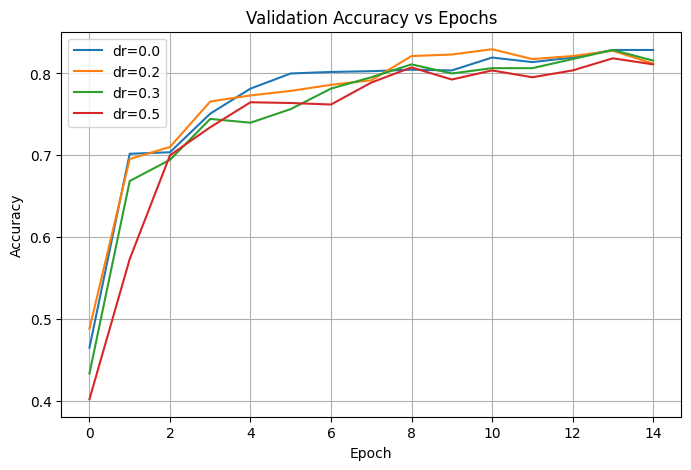

In [45]:
plt.figure(figsize=(8, 5))
for dr, accs in results.items():
    plt.plot(accs, label=f"dr={dr}")

plt.title("Validation Accuracy vs Epochs")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.legend()
plt.grid(True)
plt.show()

# Tuning with augmentation

In [46]:
train_transform = transforms.Compose([
    transforms.RandomHorizontalFlip(p=0.5),  
    transforms.RandomRotation(degrees=27),  # 0.15 * 180 ≈ 27 độ
    transforms.RandomResizedCrop(
        size=224,
        scale=(0.85, 1.0)  # zoom ~15%
    ),
    transforms.ColorJitter(
        contrast=0.15
    ),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])

train_ds = ImageDFDataset(df_train, transform=train_transform)

train_loader = DataLoader(
    train_ds,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=2,
    pin_memory=True
)

In [47]:
EPOCHS = 60
model, optimizer = make_model(learning_rate=0.0005, size_inner=256, droprate=0.2)

for epoch in range(EPOCHS):
    train_loss, train_acc = train_one_epoch(model, train_loader)
    val_loss, val_acc = validate(model, val_loader)

    print(
            f"Epoch {epoch+1}/{EPOCHS} | "
            f"Train Acc: {train_acc:.4f} | "
            f"Val Acc: {val_acc:.4f}"
        )

100%|██████████| 162/162 [00:33<00:00,  4.89it/s]


Epoch 1/60 | Train Acc: 0.2077 | Val Acc: 0.5537


100%|██████████| 162/162 [00:32<00:00,  4.96it/s]


Epoch 2/60 | Train Acc: 0.5525 | Val Acc: 0.7046


100%|██████████| 162/162 [00:32<00:00,  5.03it/s]


Epoch 3/60 | Train Acc: 0.6849 | Val Acc: 0.7593


100%|██████████| 162/162 [00:33<00:00,  4.90it/s]


Epoch 4/60 | Train Acc: 0.7352 | Val Acc: 0.7963


100%|██████████| 162/162 [00:33<00:00,  4.85it/s]


Epoch 5/60 | Train Acc: 0.7719 | Val Acc: 0.8185


100%|██████████| 162/162 [00:32<00:00,  4.95it/s]


Epoch 6/60 | Train Acc: 0.7985 | Val Acc: 0.8259


100%|██████████| 162/162 [00:33<00:00,  4.78it/s]


Epoch 7/60 | Train Acc: 0.8148 | Val Acc: 0.8333


100%|██████████| 162/162 [00:33<00:00,  4.81it/s]


Epoch 8/60 | Train Acc: 0.8302 | Val Acc: 0.8306


100%|██████████| 162/162 [00:32<00:00,  4.93it/s]


Epoch 9/60 | Train Acc: 0.8324 | Val Acc: 0.8407


100%|██████████| 162/162 [00:32<00:00,  4.98it/s]


Epoch 10/60 | Train Acc: 0.8497 | Val Acc: 0.8454


100%|██████████| 162/162 [00:33<00:00,  4.87it/s]


Epoch 11/60 | Train Acc: 0.8531 | Val Acc: 0.8417


100%|██████████| 162/162 [00:33<00:00,  4.82it/s]


Epoch 12/60 | Train Acc: 0.8620 | Val Acc: 0.8519


100%|██████████| 162/162 [00:33<00:00,  4.89it/s]


Epoch 13/60 | Train Acc: 0.8667 | Val Acc: 0.8463


100%|██████████| 162/162 [00:33<00:00,  4.83it/s]


Epoch 14/60 | Train Acc: 0.8728 | Val Acc: 0.8602


100%|██████████| 162/162 [00:34<00:00,  4.73it/s]


Epoch 15/60 | Train Acc: 0.8901 | Val Acc: 0.8556


100%|██████████| 162/162 [00:33<00:00,  4.87it/s]


Epoch 16/60 | Train Acc: 0.8910 | Val Acc: 0.8556


100%|██████████| 162/162 [00:33<00:00,  4.79it/s]


Epoch 17/60 | Train Acc: 0.8932 | Val Acc: 0.8444


100%|██████████| 162/162 [00:33<00:00,  4.85it/s]


Epoch 18/60 | Train Acc: 0.8954 | Val Acc: 0.8481


100%|██████████| 162/162 [00:34<00:00,  4.70it/s]


Epoch 19/60 | Train Acc: 0.8988 | Val Acc: 0.8565


100%|██████████| 162/162 [00:33<00:00,  4.81it/s]


Epoch 20/60 | Train Acc: 0.9009 | Val Acc: 0.8602


100%|██████████| 162/162 [00:34<00:00,  4.76it/s]


Epoch 21/60 | Train Acc: 0.9049 | Val Acc: 0.8593


100%|██████████| 162/162 [00:33<00:00,  4.82it/s]


Epoch 22/60 | Train Acc: 0.9068 | Val Acc: 0.8528


100%|██████████| 162/162 [00:33<00:00,  4.82it/s]


Epoch 23/60 | Train Acc: 0.9031 | Val Acc: 0.8463


100%|██████████| 162/162 [00:34<00:00,  4.68it/s]


Epoch 24/60 | Train Acc: 0.9096 | Val Acc: 0.8685


100%|██████████| 162/162 [00:33<00:00,  4.84it/s]


Epoch 25/60 | Train Acc: 0.9157 | Val Acc: 0.8528


100%|██████████| 162/162 [00:33<00:00,  4.83it/s]


Epoch 26/60 | Train Acc: 0.9127 | Val Acc: 0.8704


100%|██████████| 162/162 [00:33<00:00,  4.84it/s]


Epoch 27/60 | Train Acc: 0.9114 | Val Acc: 0.8630


100%|██████████| 162/162 [00:33<00:00,  4.83it/s]


Epoch 28/60 | Train Acc: 0.9207 | Val Acc: 0.8509


100%|██████████| 162/162 [00:33<00:00,  4.82it/s]


Epoch 29/60 | Train Acc: 0.9241 | Val Acc: 0.8667


100%|██████████| 162/162 [00:32<00:00,  4.94it/s]


Epoch 30/60 | Train Acc: 0.9284 | Val Acc: 0.8630


100%|██████████| 162/162 [00:34<00:00,  4.74it/s]


Epoch 31/60 | Train Acc: 0.9287 | Val Acc: 0.8694


100%|██████████| 162/162 [00:34<00:00,  4.71it/s]


Epoch 32/60 | Train Acc: 0.9309 | Val Acc: 0.8639


100%|██████████| 162/162 [00:33<00:00,  4.85it/s]


Epoch 33/60 | Train Acc: 0.9296 | Val Acc: 0.8611


100%|██████████| 162/162 [00:34<00:00,  4.72it/s]


Epoch 34/60 | Train Acc: 0.9340 | Val Acc: 0.8583


100%|██████████| 162/162 [00:33<00:00,  4.88it/s]


Epoch 35/60 | Train Acc: 0.9324 | Val Acc: 0.8611


100%|██████████| 162/162 [00:32<00:00,  4.91it/s]


Epoch 36/60 | Train Acc: 0.9367 | Val Acc: 0.8593


100%|██████████| 162/162 [00:32<00:00,  4.91it/s]


Epoch 37/60 | Train Acc: 0.9370 | Val Acc: 0.8593


100%|██████████| 162/162 [00:33<00:00,  4.84it/s]


Epoch 38/60 | Train Acc: 0.9429 | Val Acc: 0.8593


100%|██████████| 162/162 [00:32<00:00,  4.91it/s]


Epoch 39/60 | Train Acc: 0.9414 | Val Acc: 0.8602


100%|██████████| 162/162 [00:33<00:00,  4.90it/s]


Epoch 40/60 | Train Acc: 0.9333 | Val Acc: 0.8565


100%|██████████| 162/162 [00:33<00:00,  4.77it/s]


Epoch 41/60 | Train Acc: 0.9478 | Val Acc: 0.8620


100%|██████████| 162/162 [00:33<00:00,  4.78it/s]


Epoch 42/60 | Train Acc: 0.9423 | Val Acc: 0.8593


100%|██████████| 162/162 [00:32<00:00,  5.00it/s]


Epoch 43/60 | Train Acc: 0.9355 | Val Acc: 0.8583


100%|██████████| 162/162 [00:32<00:00,  4.96it/s]


Epoch 44/60 | Train Acc: 0.9438 | Val Acc: 0.8620


100%|██████████| 162/162 [00:33<00:00,  4.84it/s]


Epoch 45/60 | Train Acc: 0.9454 | Val Acc: 0.8639


100%|██████████| 162/162 [00:33<00:00,  4.79it/s]


Epoch 46/60 | Train Acc: 0.9469 | Val Acc: 0.8731


100%|██████████| 162/162 [00:32<00:00,  4.94it/s]


Epoch 47/60 | Train Acc: 0.9485 | Val Acc: 0.8528


100%|██████████| 162/162 [00:33<00:00,  4.77it/s]


Epoch 48/60 | Train Acc: 0.9475 | Val Acc: 0.8593


100%|██████████| 162/162 [00:33<00:00,  4.83it/s]


Epoch 49/60 | Train Acc: 0.9488 | Val Acc: 0.8472


100%|██████████| 162/162 [00:32<00:00,  4.94it/s]


Epoch 50/60 | Train Acc: 0.9454 | Val Acc: 0.8620


100%|██████████| 162/162 [00:33<00:00,  4.90it/s]


Epoch 51/60 | Train Acc: 0.9401 | Val Acc: 0.8611


100%|██████████| 162/162 [00:33<00:00,  4.82it/s]


Epoch 52/60 | Train Acc: 0.9497 | Val Acc: 0.8704


100%|██████████| 162/162 [00:33<00:00,  4.87it/s]


Epoch 53/60 | Train Acc: 0.9497 | Val Acc: 0.8611


100%|██████████| 162/162 [00:33<00:00,  4.86it/s]


Epoch 54/60 | Train Acc: 0.9540 | Val Acc: 0.8704


100%|██████████| 162/162 [00:33<00:00,  4.89it/s]


Epoch 55/60 | Train Acc: 0.9503 | Val Acc: 0.8667


100%|██████████| 162/162 [00:33<00:00,  4.83it/s]


Epoch 56/60 | Train Acc: 0.9503 | Val Acc: 0.8657


100%|██████████| 162/162 [00:33<00:00,  4.85it/s]


Epoch 57/60 | Train Acc: 0.9568 | Val Acc: 0.8731


100%|██████████| 162/162 [00:32<00:00,  4.93it/s]


Epoch 58/60 | Train Acc: 0.9494 | Val Acc: 0.8648


100%|██████████| 162/162 [00:34<00:00,  4.76it/s]


Epoch 59/60 | Train Acc: 0.9602 | Val Acc: 0.8620


100%|██████████| 162/162 [00:33<00:00,  4.87it/s]


Epoch 60/60 | Train Acc: 0.9552 | Val Acc: 0.8713


# Final train

In [44]:
# Pre-processing images input
IMG_SIZE = 224
BATCH_SIZE = 20

train_transform = transforms.Compose([
    transforms.RandomHorizontalFlip(p=0.5),  
    transforms.RandomRotation(degrees=27),  # 0.15 * 180 ≈ 27 độ
    transforms.RandomResizedCrop(
        size=224,
        scale=(0.85, 1.0)  # zoom ~15%
    ),
    transforms.ColorJitter(
        contrast=0.15
    ),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])

val_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std =[0.229, 0.224, 0.225]
    )
])

In [45]:
# Create DataLoader
full_train_ds = ImageDFDataset(df_full_train, transform=train_transform)
test_ds = ImageDFDataset(df_test, transform=val_transform)

full_train_loader = DataLoader(
    full_train_ds,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=2,
    pin_memory=True
)

test_loader = DataLoader(
    test_ds,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=2,
    pin_memory=True
)

In [19]:
EPOCHS = 60
criterion = nn.CrossEntropyLoss()
model, optimizer = make_model(learning_rate=0.0005, size_inner=256, droprate=0.2)

for epoch in range(EPOCHS):
    train_loss, train_acc = train_one_epoch(model, full_train_loader)
    val_loss, val_acc = validate(model, test_loader)

    print(
            f"Epoch {epoch+1}/{EPOCHS} | "
            f"Train Acc: {train_acc:.4f} | "
            f"Val Acc: {val_acc:.4f}"
        )

100%|██████████| 216/216 [00:59<00:00,  3.64it/s]


Epoch 1/60 | Train Acc: 0.2678 | Val Acc: 0.6500


100%|██████████| 216/216 [00:47<00:00,  4.53it/s]


Epoch 2/60 | Train Acc: 0.6109 | Val Acc: 0.7454


100%|██████████| 216/216 [00:47<00:00,  4.59it/s]


Epoch 3/60 | Train Acc: 0.7079 | Val Acc: 0.8204


100%|██████████| 216/216 [00:47<00:00,  4.55it/s]


Epoch 4/60 | Train Acc: 0.7632 | Val Acc: 0.8324


100%|██████████| 216/216 [00:47<00:00,  4.54it/s]


Epoch 5/60 | Train Acc: 0.7824 | Val Acc: 0.8417


100%|██████████| 216/216 [00:46<00:00,  4.69it/s]


Epoch 6/60 | Train Acc: 0.8025 | Val Acc: 0.8537


100%|██████████| 216/216 [00:47<00:00,  4.57it/s]


Epoch 7/60 | Train Acc: 0.8160 | Val Acc: 0.8537


100%|██████████| 216/216 [00:47<00:00,  4.55it/s]


Epoch 8/60 | Train Acc: 0.8278 | Val Acc: 0.8602


100%|██████████| 216/216 [00:47<00:00,  4.55it/s]


Epoch 9/60 | Train Acc: 0.8495 | Val Acc: 0.8583


100%|██████████| 216/216 [00:47<00:00,  4.51it/s]


Epoch 10/60 | Train Acc: 0.8502 | Val Acc: 0.8583


100%|██████████| 216/216 [00:48<00:00,  4.49it/s]


Epoch 11/60 | Train Acc: 0.8581 | Val Acc: 0.8556


100%|██████████| 216/216 [00:48<00:00,  4.45it/s]


Epoch 12/60 | Train Acc: 0.8611 | Val Acc: 0.8778


100%|██████████| 216/216 [00:50<00:00,  4.24it/s]


Epoch 13/60 | Train Acc: 0.8697 | Val Acc: 0.8778


100%|██████████| 216/216 [00:49<00:00,  4.40it/s]


Epoch 14/60 | Train Acc: 0.8694 | Val Acc: 0.8796


100%|██████████| 216/216 [00:48<00:00,  4.44it/s]


Epoch 15/60 | Train Acc: 0.8868 | Val Acc: 0.8704


100%|██████████| 216/216 [00:50<00:00,  4.32it/s]


Epoch 16/60 | Train Acc: 0.8799 | Val Acc: 0.8796


100%|██████████| 216/216 [00:49<00:00,  4.40it/s]


Epoch 17/60 | Train Acc: 0.8933 | Val Acc: 0.8787


100%|██████████| 216/216 [00:47<00:00,  4.54it/s]


Epoch 18/60 | Train Acc: 0.8942 | Val Acc: 0.8824


100%|██████████| 216/216 [00:48<00:00,  4.46it/s]


Epoch 19/60 | Train Acc: 0.8951 | Val Acc: 0.8778


100%|██████████| 216/216 [00:48<00:00,  4.43it/s]


Epoch 20/60 | Train Acc: 0.8965 | Val Acc: 0.8861


100%|██████████| 216/216 [00:48<00:00,  4.44it/s]


Epoch 21/60 | Train Acc: 0.8970 | Val Acc: 0.8778


100%|██████████| 216/216 [00:48<00:00,  4.49it/s]


Epoch 22/60 | Train Acc: 0.9062 | Val Acc: 0.8852


100%|██████████| 216/216 [00:48<00:00,  4.47it/s]


Epoch 23/60 | Train Acc: 0.9032 | Val Acc: 0.8704


100%|██████████| 216/216 [00:48<00:00,  4.42it/s]


Epoch 24/60 | Train Acc: 0.9102 | Val Acc: 0.8657


100%|██████████| 216/216 [00:48<00:00,  4.48it/s]


Epoch 25/60 | Train Acc: 0.9076 | Val Acc: 0.8898


100%|██████████| 216/216 [00:48<00:00,  4.43it/s]


Epoch 26/60 | Train Acc: 0.9162 | Val Acc: 0.8750


100%|██████████| 216/216 [00:47<00:00,  4.50it/s]


Epoch 27/60 | Train Acc: 0.9167 | Val Acc: 0.8963


100%|██████████| 216/216 [00:47<00:00,  4.50it/s]


Epoch 28/60 | Train Acc: 0.9169 | Val Acc: 0.8778


100%|██████████| 216/216 [00:47<00:00,  4.54it/s]


Epoch 29/60 | Train Acc: 0.9127 | Val Acc: 0.8750


100%|██████████| 216/216 [00:47<00:00,  4.55it/s]


Epoch 30/60 | Train Acc: 0.9208 | Val Acc: 0.8870


100%|██████████| 216/216 [00:47<00:00,  4.51it/s]


Epoch 31/60 | Train Acc: 0.9222 | Val Acc: 0.8917


100%|██████████| 216/216 [00:48<00:00,  4.43it/s]


Epoch 32/60 | Train Acc: 0.9234 | Val Acc: 0.8861


100%|██████████| 216/216 [00:47<00:00,  4.52it/s]


Epoch 33/60 | Train Acc: 0.9257 | Val Acc: 0.8843


100%|██████████| 216/216 [00:49<00:00,  4.37it/s]


Epoch 34/60 | Train Acc: 0.9199 | Val Acc: 0.8824


100%|██████████| 216/216 [00:48<00:00,  4.45it/s]


Epoch 35/60 | Train Acc: 0.9315 | Val Acc: 0.8824


100%|██████████| 216/216 [00:47<00:00,  4.54it/s]


Epoch 36/60 | Train Acc: 0.9294 | Val Acc: 0.8778


100%|██████████| 216/216 [00:47<00:00,  4.53it/s]


Epoch 37/60 | Train Acc: 0.9303 | Val Acc: 0.8787


100%|██████████| 216/216 [00:48<00:00,  4.48it/s]


Epoch 38/60 | Train Acc: 0.9322 | Val Acc: 0.8889


100%|██████████| 216/216 [00:49<00:00,  4.33it/s]


Epoch 39/60 | Train Acc: 0.9363 | Val Acc: 0.8833


100%|██████████| 216/216 [00:49<00:00,  4.39it/s]


Epoch 40/60 | Train Acc: 0.9326 | Val Acc: 0.8880


100%|██████████| 216/216 [00:49<00:00,  4.38it/s]


Epoch 41/60 | Train Acc: 0.9352 | Val Acc: 0.8694


100%|██████████| 216/216 [00:48<00:00,  4.42it/s]


Epoch 42/60 | Train Acc: 0.9384 | Val Acc: 0.8898


100%|██████████| 216/216 [00:49<00:00,  4.39it/s]


Epoch 43/60 | Train Acc: 0.9315 | Val Acc: 0.8889


100%|██████████| 216/216 [00:49<00:00,  4.40it/s]


Epoch 44/60 | Train Acc: 0.9331 | Val Acc: 0.8870


100%|██████████| 216/216 [00:49<00:00,  4.36it/s]


Epoch 45/60 | Train Acc: 0.9380 | Val Acc: 0.8898


100%|██████████| 216/216 [00:47<00:00,  4.57it/s]


Epoch 46/60 | Train Acc: 0.9345 | Val Acc: 0.8750


100%|██████████| 216/216 [00:46<00:00,  4.60it/s]


Epoch 47/60 | Train Acc: 0.9440 | Val Acc: 0.8769


100%|██████████| 216/216 [00:48<00:00,  4.42it/s]


Epoch 48/60 | Train Acc: 0.9424 | Val Acc: 0.8833


100%|██████████| 216/216 [00:48<00:00,  4.49it/s]


Epoch 49/60 | Train Acc: 0.9407 | Val Acc: 0.8981


100%|██████████| 216/216 [00:47<00:00,  4.52it/s]


Epoch 50/60 | Train Acc: 0.9407 | Val Acc: 0.8833


100%|██████████| 216/216 [00:48<00:00,  4.44it/s]


Epoch 51/60 | Train Acc: 0.9435 | Val Acc: 0.8815


100%|██████████| 216/216 [00:48<00:00,  4.47it/s]


Epoch 52/60 | Train Acc: 0.9461 | Val Acc: 0.8917


100%|██████████| 216/216 [00:47<00:00,  4.55it/s]


Epoch 53/60 | Train Acc: 0.9458 | Val Acc: 0.8861


100%|██████████| 216/216 [00:49<00:00,  4.37it/s]


Epoch 54/60 | Train Acc: 0.9370 | Val Acc: 0.8870


100%|██████████| 216/216 [00:48<00:00,  4.41it/s]


Epoch 55/60 | Train Acc: 0.9472 | Val Acc: 0.8889


100%|██████████| 216/216 [00:48<00:00,  4.49it/s]


Epoch 56/60 | Train Acc: 0.9475 | Val Acc: 0.8806


100%|██████████| 216/216 [00:47<00:00,  4.58it/s]


Epoch 57/60 | Train Acc: 0.9551 | Val Acc: 0.8954


100%|██████████| 216/216 [00:48<00:00,  4.46it/s]


Epoch 58/60 | Train Acc: 0.9507 | Val Acc: 0.8759


100%|██████████| 216/216 [00:48<00:00,  4.49it/s]


Epoch 59/60 | Train Acc: 0.9500 | Val Acc: 0.8815


100%|██████████| 216/216 [00:48<00:00,  4.46it/s]


Epoch 60/60 | Train Acc: 0.9484 | Val Acc: 0.8778


# F1 Score/Recall/Precision

In [46]:
model.eval()

all_preds = []
all_labels = []

with torch.no_grad():
    for images, labels in test_loader:
        images = images.to(device)
        labels = labels.to(device)

        outputs = model(images)
        preds = torch.argmax(outputs, dim=1)

        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

all_preds = np.array(all_preds)
all_labels = np.array(all_labels)

In [47]:
precision_macro = precision_score(all_labels, all_preds, average='macro')
recall_macro    = recall_score(all_labels, all_preds, average='macro')
f1_macro        = f1_score(all_labels, all_preds, average='macro')

print(f"Precision (macro): {precision_macro:.4f}")
print(f"Recall (macro):    {recall_macro:.4f}")
print(f"F1-score (macro):  {f1_macro:.4f}")

Precision (macro): 0.8845
Recall (macro):    0.8800
F1-score (macro):  0.8705


# Confusion matrix

In [59]:
y_true = np.array(all_labels) # label real
y_pred = np.array(all_preds) # label predicted
class_names = (
    df[['label_idx', 'label']]
    .drop_duplicates()
    .sort_values('label_idx')
    ['label']
    .tolist()
)

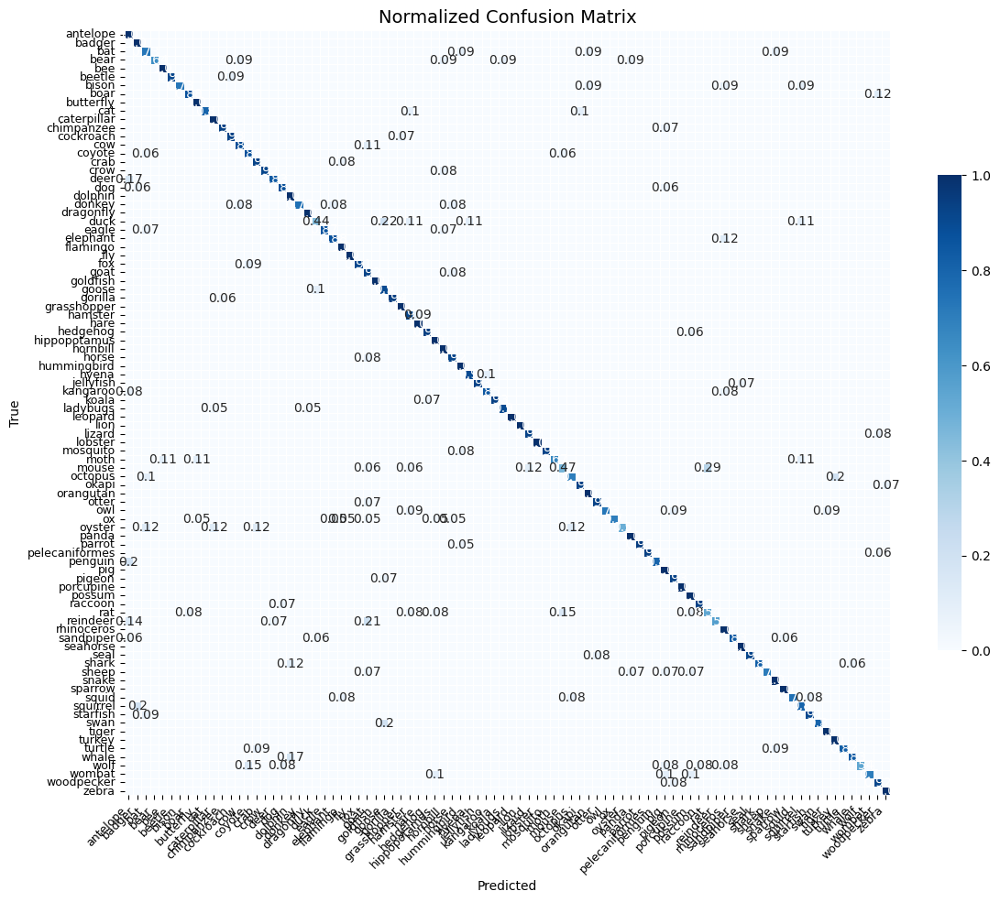

In [67]:
plt.figure(figsize=(12, 10))

sns.heatmap(
    cm,
    annot=np.where(cm >= 0.05, np.round(cm, 2), ""),
    fmt="",
    cmap="Blues",
    square=True,
    linewidths=0.5,
    linecolor="white",
    cbar_kws={"shrink": 0.6},
    xticklabels=class_names,
    yticklabels=class_names
)

plt.xticks(rotation=45, ha="right", fontsize=9)
plt.yticks(fontsize=9)
plt.xlabel("Predicted")
plt.ylabel("True")
plt.title("Normalized Confusion Matrix", fontsize=14)
plt.tight_layout()
plt.show()

In [68]:
print(classification_report(
    y_true,
    y_pred,
    target_names=class_names,
    digits=4
))

                precision    recall  f1-score   support

      antelope     0.6500    1.0000    0.7879        13
        badger     0.8571    1.0000    0.9231        12
           bat     0.6154    0.7273    0.6667        11
          bear     1.0000    0.6364    0.7778        11
           bee     0.8571    1.0000    0.9231         6
        beetle     1.0000    0.9091    0.9524        11
         bison     1.0000    0.7273    0.8421        11
          boar     0.8750    0.8750    0.8750         8
     butterfly     0.8000    1.0000    0.8889         8
           cat     1.0000    0.8000    0.8889        10
   caterpillar     0.8182    1.0000    0.9000         9
    chimpanzee     0.9333    0.9333    0.9333        15
     cockroach     0.9286    0.9286    0.9286        14
           cow     0.8000    0.8889    0.8421         9
        coyote     0.8235    0.8750    0.8485        16
          crab     0.8571    0.9231    0.8889        13
          crow     1.0000    0.9167    0.9565  